<img src="https://github.com/djp840/MSDS_453_Public/blob/main/images/NorthwesternHeader.png?raw=1">

## MSDS453 - Research Assignment 01 - First Vectorized Representation


Our goal in this exercise is to BEGIN coming to a common agreement, among this class, as to what terms we will use as we selectively refine our corpus-wide vocabulary. This corpus vocabulary is what would represent the content of each different document for clustering and classification purposes, which will be our next step. This means that we need to make decisions - what is in, what is out.

In [211]:
import pandas as pd
import os
import numpy as np
import re
import string
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
import random
from dataclasses import dataclass

from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem import PorterStemmer

import gensim
from gensim.models import Word2Vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE

import scipy.cluster.hierarchy

from IPython.display import display, HTML

from typing import List, Callable, Dict

### Mount Google Drive to Colab Environment

<div class="alert alert-block alert-success">
    <b>Directories Required for Research Assignment</b>:<br>
1. Data Directory - Source Class Corpus Data<br>
2. Output Directory - Vocabulary<br>
</div>

#### Uncomment To Map Drive

In [212]:
#from google.colab import drive
#drive.mount('/content/gdrive/My Drive')
##drive.mount('/content/gdrive/')

### NLTK Downloads

In [213]:
# Only run this once, they will be downloaded.
nltk.download('stopwords',quiet=True)
nltk.download('wordnet',quiet=True)
nltk.download('punkt',quiet=True)
nltk.download('omw-1.4',quiet=True)

True

<div class="alert alert-block alert-danger">
<b>Gensim</b> is a Python library for topic modelling, document indexing and similarity retrieval with large corpora. Target audience is the natural language processing (NLP) and information retrieval (IR) community <br><br>
    <b>https://pypi.org/project/gensim/ </b>
</div>

In [214]:
import pkg_resources
#pkg_resources.require("gensim<=3.8.3");

In [215]:
print("Genism Version: ", gensim.__version__)

Genism Version:  4.3.0


<div class="alert alert-block alert-info">
    <b>Suppress warning messages</b></div>

In [216]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

## Utility Functions

In [217]:
def add_movie_descriptor(data: pd.DataFrame, corpus_df: pd.DataFrame):
    """
    Adds "Movie Description" to the supplied dataframe, in the form {Genre}_{P|N}_{Movie Title}_{DocID}
    """
    review = np.where(corpus_df['Review Type (pos or neg)'] == 'Positive', 'P', 'N')
    data['Descriptor'] = corpus_df['Genre of Movie'] + '_' + corpus_df['Movie Title'] + '_' + review + '_' + corpus_df['Doc_ID'].astype(str)

def get_corpus_df(path):
    data = pd.read_csv(path, encoding="utf-8")
    add_movie_descriptor(data, data)
    sorted_data = data.sort_values(['Descriptor'])
    indexed_data = sorted_data.set_index(['Doc_ID'])
    indexed_data['Doc_ID'] = indexed_data.index
    return indexed_data

def remove_punctuation(text):
    return re.sub('[^a-zA-Z]', ' ', str(text))

def lower_case(text):
    return text.lower()

def remove_tags(text):
    return re.sub("&lt;/?.*?&gt;"," &lt;&gt; ", text)

def remove_special_chars_and_digits(text):
    return re.sub("(\\d|\\W)+"," ", text)

@dataclass
class Document:
    doc_id: str
    text: str

def normalize_document(document: Document) -> Document:
    text = document.text
    text = remove_punctuation(text)
    text = lower_case(text)
    text = remove_tags(text)
    text = remove_special_chars_and_digits(text)

    return Document(document.doc_id, text)

def normalize_documents(documents: List[Document]) -> List[Document]:
    """
    Normalizes text for all given documents.
    Removes punctuation, converts to lower case, removes tags and special characters.
    """
    return [normalize_document(x) for x in documents]

@dataclass
class TokenizedDocument:
    doc_id: str
    tokens: List[str]

def tokenize_document(document: Document) -> TokenizedDocument:
    tokens = nltk.word_tokenize(document.text)
    return TokenizedDocument(document.doc_id, tokens)

def tokenize_documents(documents: List[Document]) -> List[TokenizedDocument]:
    return [tokenize_document(x) for x in documents]

def lemmatize(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    lemmatizer = WordNetLemmatizer()
    for document in documents:
        output_tokens = [lemmatizer.lemmatize(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))

    return result

def stem(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    stemmer = PorterStemmer()
    for document in documents:
        output_tokens = [stemmer.stem(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))

    return result

def remove_stop_words(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []

    stop_words = set(nltk.corpus.stopwords.words('english'))
    for document in documents:
        filtered_tokens = [w for w in document.tokens if not w in stop_words]
        result.append(TokenizedDocument(document.doc_id, filtered_tokens))

    return result

def add_flags(data: pd.DataFrame, casino_royale_doc_ids: List[int], action_doc_ids: List[int]):
    data['is_casino_royale'] = data.index.isin(casino_royale_doc_ids)
    data['is_action'] = data.index.isin(action_doc_ids)

def get_all_tokens(documents: List[TokenizedDocument]) -> List[str]:
    tokens = {y for x in documents for y in x.tokens}
    return sorted(list(tokens))

## Loading the corpus

In [218]:
CORPUS_PATH=\
'https://raw.githubusercontent.com/barrycforever/MSDS_453_NLP/main/MSDS453_ClassCorpus/MSDS453_ClassCorpus_Final_Sec56_v1_20241003.csv'
corpus_df = get_corpus_df(CORPUS_PATH)
documents = [Document(x, y) for x, y in zip(corpus_df.Doc_ID, corpus_df.Text)]

In [219]:
# CORPUS_PATH = './data/MSDS453_Sec57_TestQA_ClassCorpus.csv'
# corpus_df = get_corpus_df(CORPUS_PATH)
# documents = [Document(x, y) for x, y in zip(corpus_df.Doc_ID, corpus_df.Text)]

1. Dataframe = corpus_df
2. List = documents (Document ID, Text)

## Exploritory Data Analysis

In [220]:
corpus_df.shape

(200, 9)

In [221]:
corpus_df.head(20).T

Doc_ID,166,167,168,169,170,161,162,163,164,165,226,227,228,229,230,221,222,223,224,225
DSI_Title,PLW_Doc6_Kingsman__The_Secret_Service,PLW_Doc7_Kingsman__The_Secret_Service,PLW_Doc8_Kingsman__The_Secret_Service,PLW_Doc9_Kingsman__The_Secret_Service,PLW_Doc10_Kingsman__The_Secret_Service,PLW_Doc1_Kingsman__The_Secret_Service,PLW_Doc2_Kingsman__The_Secret_Service,PLW_Doc3_Kingsman__The_Secret_Service,PLW_Doc4_Kingsman__The_Secret_Service,PLW_Doc5_Kingsman__The_Secret_Service,UIY_Doc6_No_Time_to_Die,UIY_Doc7_No_Time_to_Die,UIY_Doc8_No_Time_to_Die,UIY_Doc9_No_Time_to_Die,UIY_Doc10_No_Time_to_Die,UIY_Doc1_No_Time_to_Die,UIY_Doc2_No_Time_to_Die,UIY_Doc3_No_Time_to_Die,UIY_Doc4_No_Time_to_Die,UIY_Doc5_No_Time_to_Die
Submission File Name,PLW_Doc6_Kingsman__The_Secret_Service,PLW_Doc7_Kingsman__The_Secret_Service,PLW_Doc8_Kingsman__The_Secret_Service,PLW_Doc9_Kingsman__The_Secret_Service,PLW_Doc10_Kingsman__The_Secret_Service,PLW_Doc1_Kingsman__The_Secret_Service,PLW_Doc2_Kingsman__The_Secret_Service,PLW_Doc3_Kingsman__The_Secret_Service,PLW_Doc4_Kingsman__The_Secret_Service,PLW_Doc5_Kingsman__The_Secret_Service,UIY_Doc6_No_Time_to_Die,UIY_Doc7_No_Time_to_Die,UIY_Doc8_No_Time_to_Die,UIY_Doc9_No_Time_to_Die,UIY_Doc10_No_Time_to_Die,UIY_Doc1_No_Time_to_Die,UIY_Doc2_No_Time_to_Die,UIY_Doc3_No_Time_to_Die,UIY_Doc4_No_Time_to_Die,UIY_Doc5_No_Time_to_Die
Student Name,PLW,PLW,PLW,PLW,PLW,PLW,PLW,PLW,PLW,PLW,UIY,UIY,UIY,UIY,UIY,UIY,UIY,UIY,UIY,UIY
Genre of Movie,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action,Action
Review Type (pos or neg),Negative,Negative,Negative,Negative,Negative,Positive,Positive,Positive,Positive,Positive,Negative,Negative,Negative,Negative,Negative,Positive,Positive,Positive,Positive,Positive
Movie Title,Kingsman__The_Secret_Service,Kingsman__The_Secret_Service,Kingsman__The_Secret_Service,Kingsman__The_Secret_Service,Kingsman__The_Secret_Service,Kingsman__The_Secret_Service,Kingsman__The_Secret_Service,Kingsman__The_Secret_Service,Kingsman__The_Secret_Service,Kingsman__The_Secret_Service,No_Time_to_Die,No_Time_to_Die,No_Time_to_Die,No_Time_to_Die,No_Time_to_Die,No_Time_to_Die,No_Time_to_Die,No_Time_to_Die,No_Time_to_Die,No_Time_to_Die
Text,One complaint that has always dogged the James...,The main reason Kingsman: The Secret Service l...,"""Kingsman: The Secret Service"" makes up its ow...","Silly, sadistic and finally a little galling, ...","""The Spy Who Amused Me,"" James Bond, has abdic...",The kind of action extravaganza only a truly f...,"""Kingsman: The Secret Service,"" starring a nat...",Forget Fifty Shades of Grey. The truly shockin...,Starring Taron Egerton and Colin Firth. Co-wri...,"Those who file into theaters to see ""Kingsman:...",Cary Joji Fukunaga's No Time To Die is heavy-h...,"No Time to Die, the latest and last appearance...","Over 24 movies, James Bond has faced off again...",As part of a franchise so beholden to traditio...,In almost every James Bond film our hero preve...,In this deeply edifying final installment of D...,"""No Time to Die"" (2021) is the fifth and final...","Last September, Daniel Craig's swan song as Ja...","Sooner or later, every great run inevitably re...",It's the end of an era. After starring in 5 mo...
Descriptor,Action_Kingsman__The_Secret_Service_N_166,Action_Kingsman__The_Secret_Service_N_167,Action_Kingsman__The_Secret_Service_N_168,Action_Kingsman__The_Secret_Service_N_169,Action_Kingsman__The_Secret_Service_N_170,Action_Kingsman__The_Secret_Service_P_161,Action_Kingsman__The_Secret_Service_P_162,Action_Kingsman__The_Secret_Service_P_163,Action_Kingsman__The_Secret_Service_P_164,Action_Kingsman__The_Secret_Service_P_165,Action_No_Time_to_Die_N_226,Action_No_Time_to_Die_N_227,Action_No_Time_to_Die_N_228,Action_No_Time_to_Die_N_229,Action_No_Time_to_Die_N_230,Action_No_Time_to_Die_P_221,Action_No_Time_to_Die_P_222,Action_No_Time_to_Die_P_223,Action_No_Time_to_Die_P_224,Action_No_Time_t

In [222]:
print(corpus_df.info());

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 166 to 269
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   DSI_Title                 200 non-null    object
 1   Submission File Name      200 non-null    object
 2   Student Name              200 non-null    object
 3   Genre of Movie            200 non-null    object
 4   Review Type (pos or neg)  200 non-null    object
 5   Movie Title               200 non-null    object
 6   Text                      200 non-null    object
 7   Descriptor                200 non-null    object
 8   Doc_ID                    200 non-null    int64 
dtypes: int64(1), object(8)
memory usage: 15.6+ KB
None


In [223]:
print(corpus_df['Movie Title'].unique())

['Kingsman__The_Secret_Service' 'No_Time_to_Die' 'Taken'
 'The_Batman(2022)' 'Top_Gun' 'Barbie' 'Dirty_Grandpa' 'Lost_City'
 'Mean_Girls' 'Scott_Pilgrim_vs._the_World' 'Drag_Me_To_Hell' 'Fresh'
 'It_Chapter_Two' 'The_Conjuring_2' 'The_Others' 'Equilibirum' 'Inception'
 'Minority_Report' 'Oblivion' 'Pitch_Black']


## Number of Reviews By Genre

In [224]:
counts_df = corpus_df[['Genre of Movie']].copy()
counts_df['Count'] = 1
counts_df.groupby(['Genre of Movie']).count().reset_index()

,Genre of Movie,Count
0,Action,50
1,Comedy,50
2,Horror,50
3,Sci-Fi,50


In [225]:
corpus_df.columns

Index(['DSI_Title', 'Submission File Name', 'Student Name', 'Genre of Movie',
       'Review Type (pos or neg)', 'Movie Title', 'Text', 'Descriptor',
       'Doc_ID'],
      dtype='object')

## Normalized Document

1. remove_punctuation(text)
2. lower_case(text)
3. remove_tags(text)
4. remove_special_chars_and_digits(text)
5. return Document(document.doc_id, text)

In [226]:
normalized_documents = normalize_documents(documents)
normalized_documents[0]

Document(doc_id=166, text='one complaint that has always dogged the james bond franchise over the years is the inescapable fact that while the films seem to be loaded with gratuitous sex and violence in theory they never quite manage to show them in any great detail obviously the decision to imply more than display has served the producers for more than a half century but can you imagine what it would be like if a bond film were to include all the seamier elements that they have only hinted at in the past the early word on the over the top action comedy kingsman the secret service seemed to suggest that it would pay homage to the bond films of oldthe ones made before the series took its turn towards the comparatively serious with the arrival of daniel craigwhile including all the good parts that had been largely absent in the past alas it seems to have taken its inspiration from one of the lesser roger moore efforts than the classic connerys and the result is a fitfully amusing but inc

## Standardize Document

#### NLTK Tokenizer Package

https://www.nltk.org/api/nltk.tokenize.html

Tokenizers divide strings into lists of substrings. For example, tokenizers can be used to find the words and punctuation in a string:

### Functions for Tokenization Process
1. tokenize_document
2. tokenize_documents

In [227]:
tokenized_documents = tokenize_documents(normalized_documents)
tokenized_documents[0]

TokenizedDocument(doc_id=166, tokens=['one', 'complaint', 'that', 'has', 'always', 'dogged', 'the', 'james', 'bond', 'franchise', 'over', 'the', 'years', 'is', 'the', 'inescapable', 'fact', 'that', 'while', 'the', 'films', 'seem', 'to', 'be', 'loaded', 'with', 'gratuitous', 'sex', 'and', 'violence', 'in', 'theory', 'they', 'never', 'quite', 'manage', 'to', 'show', 'them', 'in', 'any', 'great', 'detail', 'obviously', 'the', 'decision', 'to', 'imply', 'more', 'than', 'display', 'has', 'served', 'the', 'producers', 'for', 'more', 'than', 'a', 'half', 'century', 'but', 'can', 'you', 'imagine', 'what', 'it', 'would', 'be', 'like', 'if', 'a', 'bond', 'film', 'were', 'to', 'include', 'all', 'the', 'seamier', 'elements', 'that', 'they', 'have', 'only', 'hinted', 'at', 'in', 'the', 'past', 'the', 'early', 'word', 'on', 'the', 'over', 'the', 'top', 'action', 'comedy', 'kingsman', 'the', 'secret', 'service', 'seemed', 'to', 'suggest', 'that', 'it', 'would', 'pay', 'homage', 'to', 'the', 'bond', '

## Useful Lookups (Titles by DocID, Genres by DocID, Description by DocID)

In [228]:
titles_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Movie Title'])}
genres_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Genre of Movie'])}
descriptors_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Descriptor'])}

action_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] == 'Action']
action_documents = [x for x in documents if x.doc_id in action_doc_ids]

non_action_doc_ids = {int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] != 'Action'}
non_action_documents = [x for x in documents if x.doc_id in non_action_doc_ids]

## Lookup for Specific Movie Title

In [229]:
print(corpus_df['Movie Title'].unique())

['Kingsman__The_Secret_Service' 'No_Time_to_Die' 'Taken'
 'The_Batman(2022)' 'Top_Gun' 'Barbie' 'Dirty_Grandpa' 'Lost_City'
 'Mean_Girls' 'Scott_Pilgrim_vs._the_World' 'Drag_Me_To_Hell' 'Fresh'
 'It_Chapter_Two' 'The_Conjuring_2' 'The_Others' 'Equilibirum' 'Inception'
 'Minority_Report' 'Oblivion' 'Pitch_Black']


In [230]:
casino_royale_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if titles_by_doc_ids[x] == 'Batman']
casino_royale_documents = [x for x in documents if x.doc_id in casino_royale_doc_ids]

## Qualitative Term Determinations

#### Terms Determined by Document of Interest

In [231]:
candidate_terms = [
    'maverick',
    'gun',
    'film',
    'movie',
    'aerial'
]

## CountVectorizer

<div class="alert alert-block alert-success">
    <b>sklearn.feature_extraction.text.CountVectorizer</b>:<br>
Convert a collection of text documents to a matrix of token counts.<br>
This implementation produces a sparse representation of the counts using scipy.sparse.csr_matrix.<br>
If you do not provide an a-priori dictionary and you do not use an analyzer that does some kind of feature selection then the number of features will be equal to the vocabulary size found by analyzing the data.
</div>

In [232]:
vectorizer = CountVectorizer(ngram_range=(1, 1))
text_for_counts = [x.text for x in normalized_documents]
matrix = vectorizer.fit_transform(text_for_counts)
words = vectorizer.get_feature_names_out()
word_counts = pd.DataFrame(matrix.toarray(), columns=words, index=corpus_df.Doc_ID)

In [233]:
add_flags(word_counts, casino_royale_doc_ids, action_doc_ids)
word_counts['Doc_ID'] = word_counts.index

In [234]:
# Collect result into a dataframe
mean_frequencies = pd.DataFrame(index=candidate_terms)

casino_royale_mean_frequencies = word_counts[word_counts.is_casino_royale][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['Top_Gun'] = casino_royale_mean_frequencies

action_mean_frequencies = word_counts[word_counts.is_action][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Action'] = action_mean_frequencies

non_action_mean_frequencies = word_counts[~word_counts.is_action][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Non-Action'] = non_action_mean_frequencies

In [235]:
mean_frequencies.fillna(0.0).sort_values(['Top_Gun'], ascending=False)

,Top_Gun,All Action,All Non-Action
maverick,0.00,1.40,0.01
gun,0.00,1.28,0.05
film,0.00,3.28,2.71
movie,0.00,2.78,2.17
aerial,0.00,0.40,0.00


In [236]:
# These are identified
important_prevalent_terms = [
    'maverick',
    'gun',
    'aerial'
]
stemmer = PorterStemmer()
stemmed_important_prevalent_terms = [stemmer.stem(x) for x in important_prevalent_terms]

In [237]:
pd.options.display.float_format = '{:,.2f}'.format
mean_frequencies.fillna(0.0).loc[important_prevalent_terms].round(2).sort_values(['Top_Gun'], ascending=False)

,Top_Gun,All Action,All Non-Action
maverick,0.00,1.40,0.01
gun,0.00,1.28,0.05
aerial,0.00,0.40,0.00


## TF-IDF Experiment Functions - Text Normalization

In [238]:
def run_tfidf(documents: List[Document],
              clean_func: Callable[[List[Document]], List[TokenizedDocument]],
              important_prevalent_terms: List[str],
              experiment_name: str,
              output_tfidf_vectors: bool=False,
              output_vocabulary: bool=True):
    cleaned_documents = clean_func(documents)
    cleaned_document_text = [' '.join(x.tokens) for x in cleaned_documents]

    vectorizer = TfidfVectorizer(use_idf=True,
                                 ngram_range=(1, 1),
                                 norm=None)

    transformed_documents = vectorizer.fit_transform(cleaned_document_text)
    transformed_documents_as_array = transformed_documents.toarray()

    output_dir = f'output/{experiment_name}_Results'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_tfidf_vectors:
        for counter, doc in enumerate(transformed_documents_as_array):
            tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
            one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])\
                                        .sort_values(by='score', ascending=False)\
                                        .reset_index(drop=True)

            one_doc_as_df.to_csv(f'{output_dir}/{corpus_df["Submission File Name"][counter]}')

    if output_vocabulary:
        with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
            words = sorted(vectorizer.get_feature_names_out())
            print('\n'.join(words), file=vocab)

    # Create document-term dataframe
    doc_term_matrix = transformed_documents.todense()
    doc_term_df = pd.DataFrame(doc_term_matrix,
                               columns=vectorizer.get_feature_names_out(),
                               index=corpus_df.Doc_ID)
    add_flags(doc_term_df, casino_royale_doc_ids, action_doc_ids)

    # Print the top 10 mean TF-IDF values
    top10_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(10))
    top10_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
    display(top10_tfidf)

    # Collect result into a dataframe
    tfidf_results = pd.DataFrame(index=important_prevalent_terms)

    all_tfidf_results = doc_term_df[[x for x in important_prevalent_terms if x in doc_term_df.columns]].mean().round(2)
    tfidf_results['All Movies'] = all_tfidf_results

    plt.hist(doc_term_df.mean(), 100, range=(0, 8))

    print(f'Vocabulary size: {doc_term_df.shape[1]}')

    descriptors = corpus_df['Descriptor']

    similarities = cosine_similarity(doc_term_df.loc[action_doc_ids], doc_term_df.loc[action_doc_ids])
    fig, ax = plt.subplots(figsize=(30, 30))
    labels = [descriptors_by_doc_ids[x.doc_id] for x in action_documents]
    sns.heatmap(ax=ax, data=similarities, xticklabels=labels, yticklabels=labels)
    #plt.savefig(f'figures/{experiment_name}_heatmap_documents.png')
    plt.show()

## TF-IDF  (Term Frequency-Inverse Document Frequency)

### Experiments, Normalize, Tokenize, Lemmatization and Stop Word Removal

In [239]:
def clean_method(documents: List[Document]) -> List[TokenizedDocument]:
    """
    Normalizes text, tokenizes, lemmatizes, and removes stop words.
    """
    documents = normalize_documents(documents)
    documents = tokenize_documents(documents)
    documents = lemmatize(documents)
    documents = remove_stop_words(documents)
    documents = stem(documents)

    return documents

,Mean TF-IDF
film,3.92
movi,3.77
barbi,2.52
wa,2.46
one,2.30
like,2.26
ha,2.14
charact,2.09
time,1.97
batman,1.91


Vocabulary size: 8122


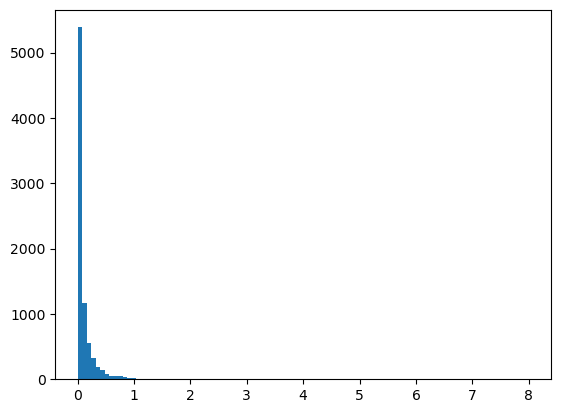

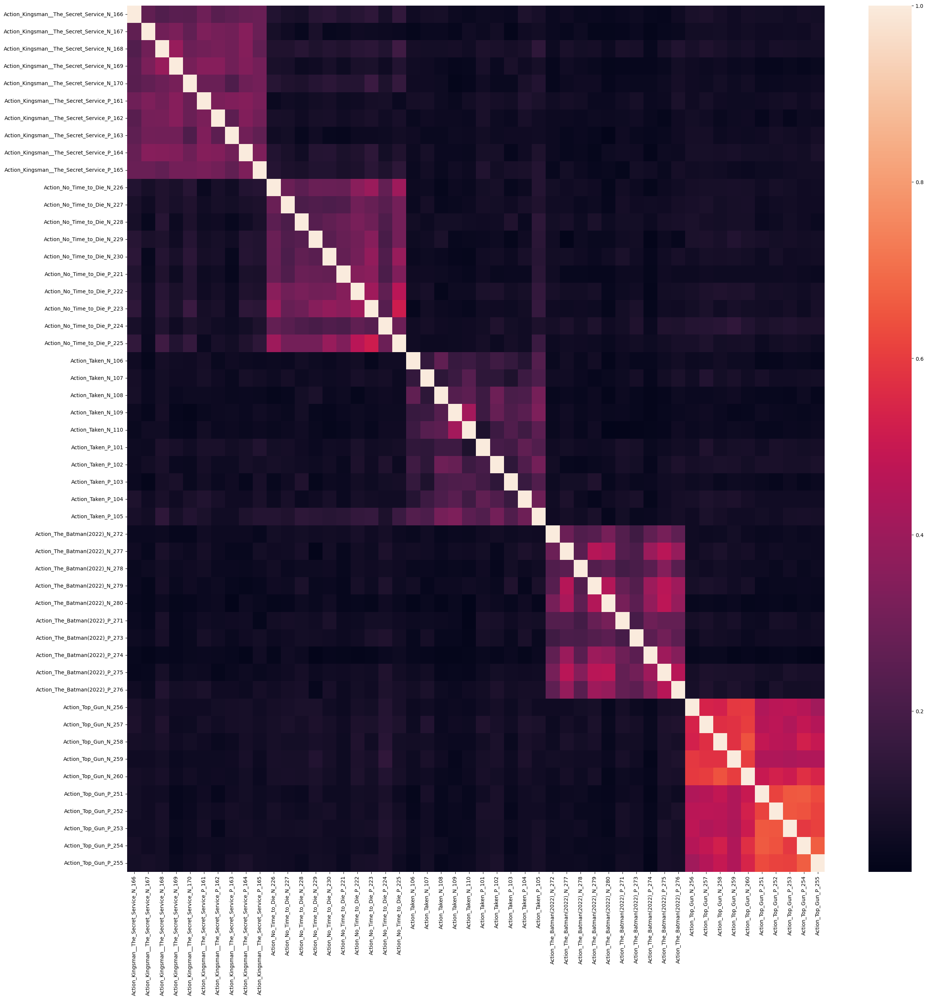

In [240]:
run_tfidf(documents, clean_method, important_prevalent_terms, 'TFIDF_exp')

## Word2Vec

<div class="alert alert-block alert-success">
    <b>Word2vec embeddings</b>: https://radimrehurek.com/gensim/models/word2vec.html <br>
    This module implements the word2vec family of algorithms, using highly optimized C routines, data streaming and Pythonic interfaces.
            </div>

## Utility Functions For Word2Vec Experiments

In [241]:
def get_word2vec_vectors(documents: List[TokenizedDocument], embedding_size: int) -> pd.DataFrame:
    tokens = [x.tokens for x in documents]

    word2vec_model = Word2Vec(sentences=tokens, vector_size=embedding_size, window=3, min_count=1, workers=12)

    vectors = {}
    for i in word2vec_model.wv.index_to_key:
        temp_vec = word2vec_model.wv[i]
        vectors[i] = temp_vec

    result = pd.DataFrame(vectors).transpose()
    result = result.sort_index()
    return result

def plot_similarity_matrix(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(ax=ax, data=similarities, xticklabels=data.index, yticklabels=data.index);
    #plt.savefig(f'figures/{experiment_name}_heatmap.png')
    plt.close()

def plot_similarity_clustermap(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    cm = sns.clustermap(similarities, metric='cosine', xticklabels=data.index, yticklabels=data.index, method='complete', cmap='RdBu', figsize=figsize)
    cm.ax_row_dendrogram.set_visible(False)
    cm.ax_col_dendrogram.set_visible(False)
    plt.legend(loc='upper left')
    #plt.savefig(f'figures/{experiment_name}_clustermap.png')
    plt.show()
    plt.close()

def plot_tsne(data: pd.DataFrame, perplexity: int, experiment_name: str, figsize=(40, 40)):
    """
    Creates a TSNE plot of the supplied dataframe
    """
    tsne_model = TSNE(perplexity=perplexity, n_components=2, learning_rate='auto', init='pca', n_iter=1000, random_state=32)
    new_values = tsne_model.fit_transform(data)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=figsize)
    labels = list(data.index)
    for i in range(len(x)):
        new_value = new_values[i]
        x = new_value[0]
        y = new_value[1]

        plt.scatter(x, y)
        plt.annotate(labels[i],
                     xy=(x, y),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    #plt.savefig(f'figures/{experiment_name}_tsne.png')
    plt.show()
    plt.close()

def run_word2vec_experiment(documents: List[Document],
                            clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                            embedding_size: int,
                            chosen_tokens: List[str],
                            experiment_name: str):
    
    cleaned_documents = clean_func(documents)

    word2vec_df = get_word2vec_vectors(cleaned_documents, embedding_size)
    filtered_word2vec_df = word2vec_df.loc[chosen_tokens].copy()

    plot_tsne(filtered_word2vec_df, 30, experiment_name)
    plot_similarity_matrix(filtered_word2vec_df, experiment_name)
    plot_similarity_clustermap(filtered_word2vec_df, experiment_name)
    # # Step 1: Clean the documents
    # cleaned_documents = clean_func(documents)

    # # Step 2: Train Word2Vec model and get vectors
    # word2vec_df = get_word2vec_vectors(cleaned_documents, embedding_size)

    # # Step 3: Filter chosen tokens to only include those that exist in word2vec_df's index
    # filtered_chosen_tokens = [token for token in chosen_tokens if token in word2vec_df.index]

    # # Step 4: Ensure that some tokens are selected (prevent running on an empty selection)
    # if not filtered_chosen_tokens:
    #     raise ValueError("No chosen tokens are found in Word2Vec vocabulary. Adjust token selection.")

    # # Step 5: Filter word2vec_df to only include the filtered tokens
    # filtered_word2vec_df = word2vec_df.loc[filtered_chosen_tokens].copy()

    # # Step 6: Continue with plotting
    # plot_tsne(filtered_word2vec_df, 30, experiment_name)
    # plot_similarity_matrix(filtered_word2vec_df, experiment_name)
    # plot_similarity_clustermap(filtered_word2vec_df, experiment_name)

In [242]:
extra_terms = [
    'bond',
    'craig',
    'star',
    'casino',
    'action'
]

In [243]:
# Get our terms to examine in experiements 4-12
all_tokens = get_all_tokens(remove_stop_words(clean_method(documents)))
chosen_tokens = random.choices(all_tokens, k=100 - len(extra_terms)) + extra_terms

lemmatizer = WordNetLemmatizer()
lemmatized_chosen_tokens = [lemmatizer.lemmatize(x) for x in chosen_tokens]
stemmed_chosen_tokens = [stemmer.stem(x) for x in lemmatized_chosen_tokens]

## Word2Vec Experiments:


<div class="alert alert-block alert-success">
    <b>Word2vec embeddings</b>: https://radimrehurek.com/gensim/models/word2vec.html <br>
    This module implements the word2vec family of algorithms, using highly optimized C routines, data streaming and Pythonic interfaces.
            </div>

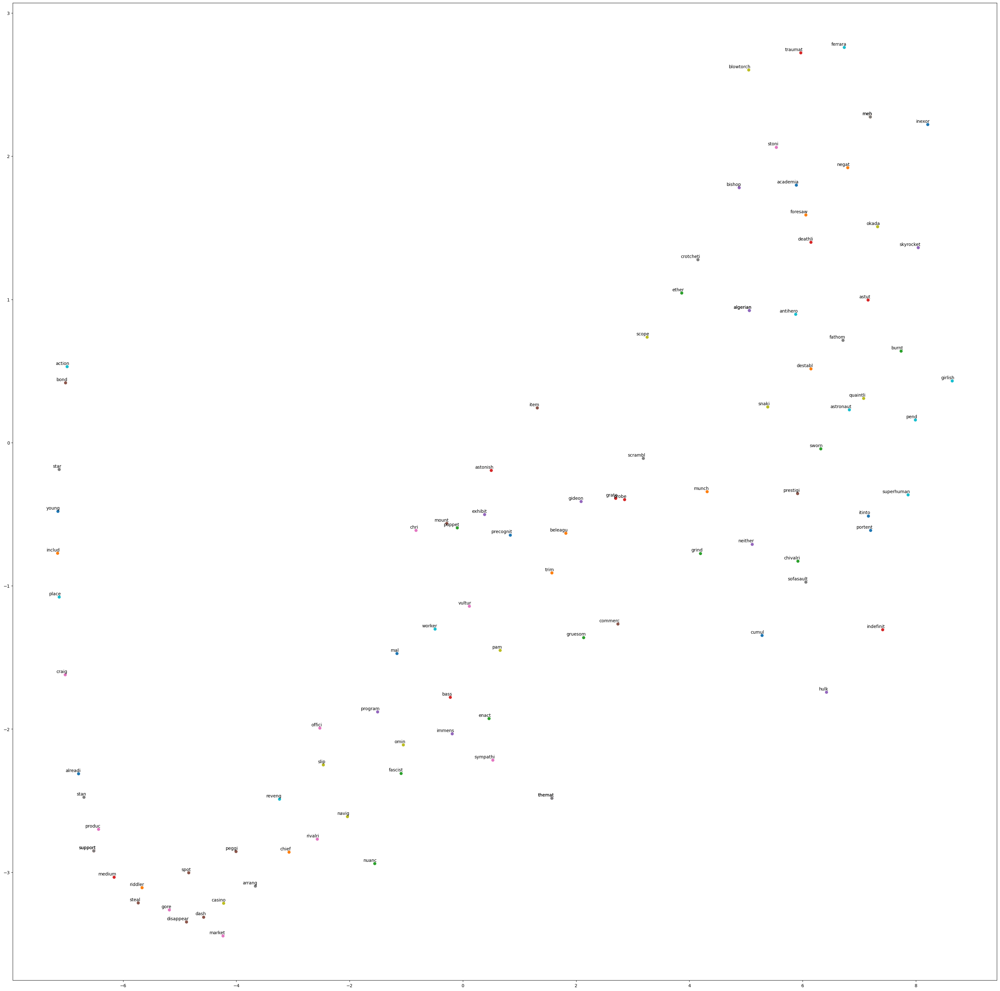

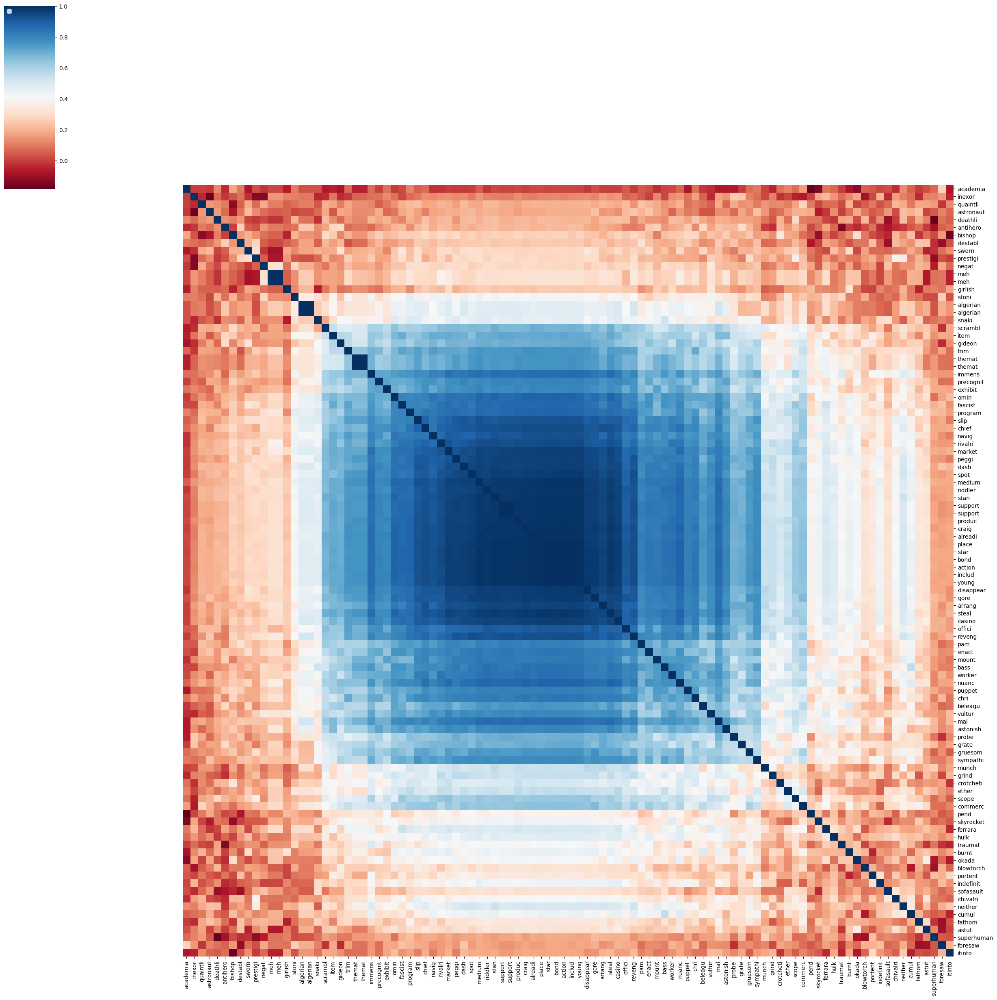

In [244]:
run_word2vec_experiment(documents, clean_method, 100, chosen_tokens, 'Word2Vec_exp')

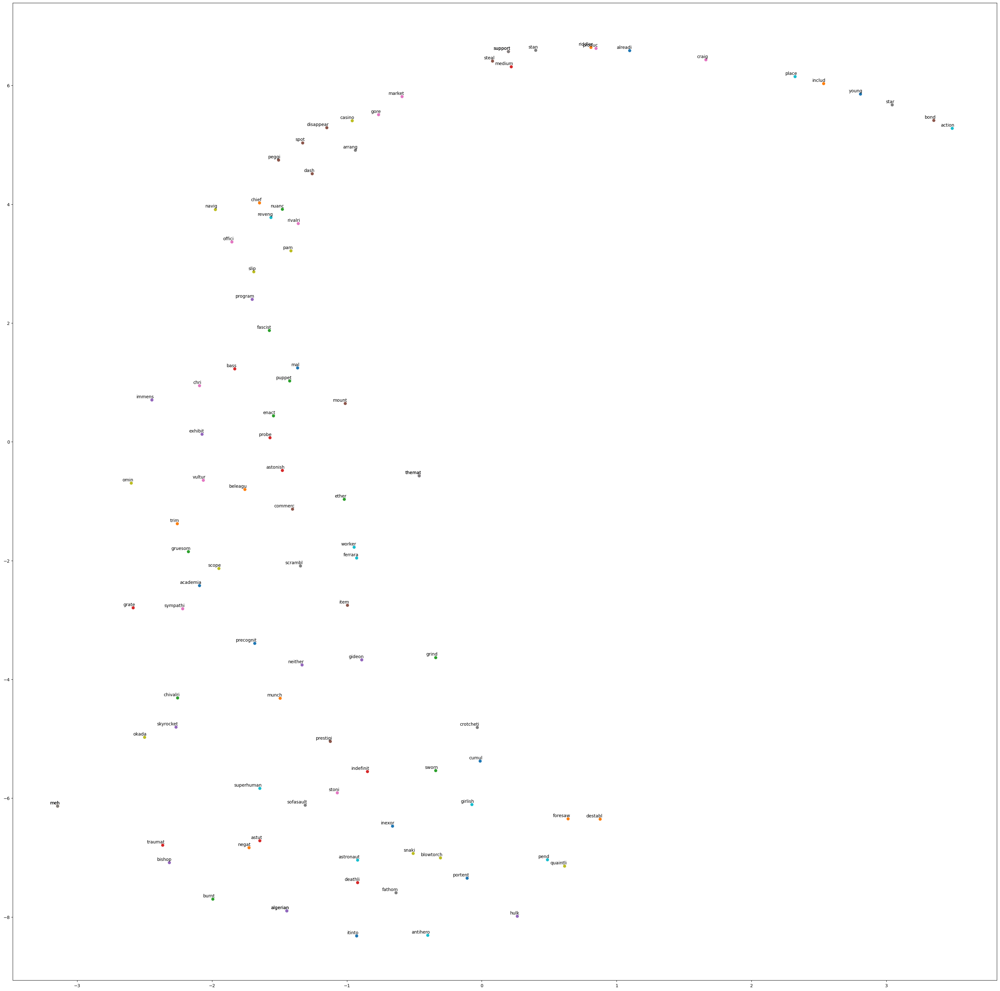

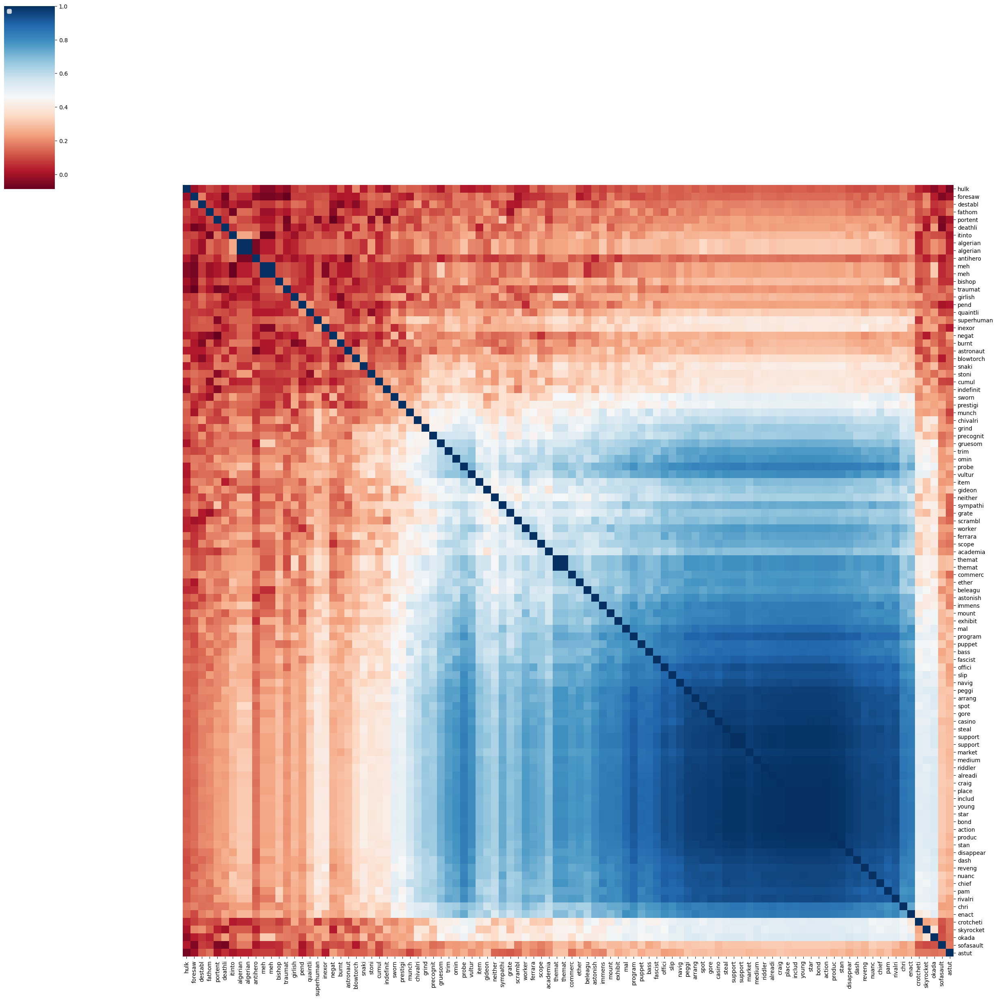

In [245]:
run_word2vec_experiment(documents, clean_method, 200, chosen_tokens, 'Word2Vec_exp')

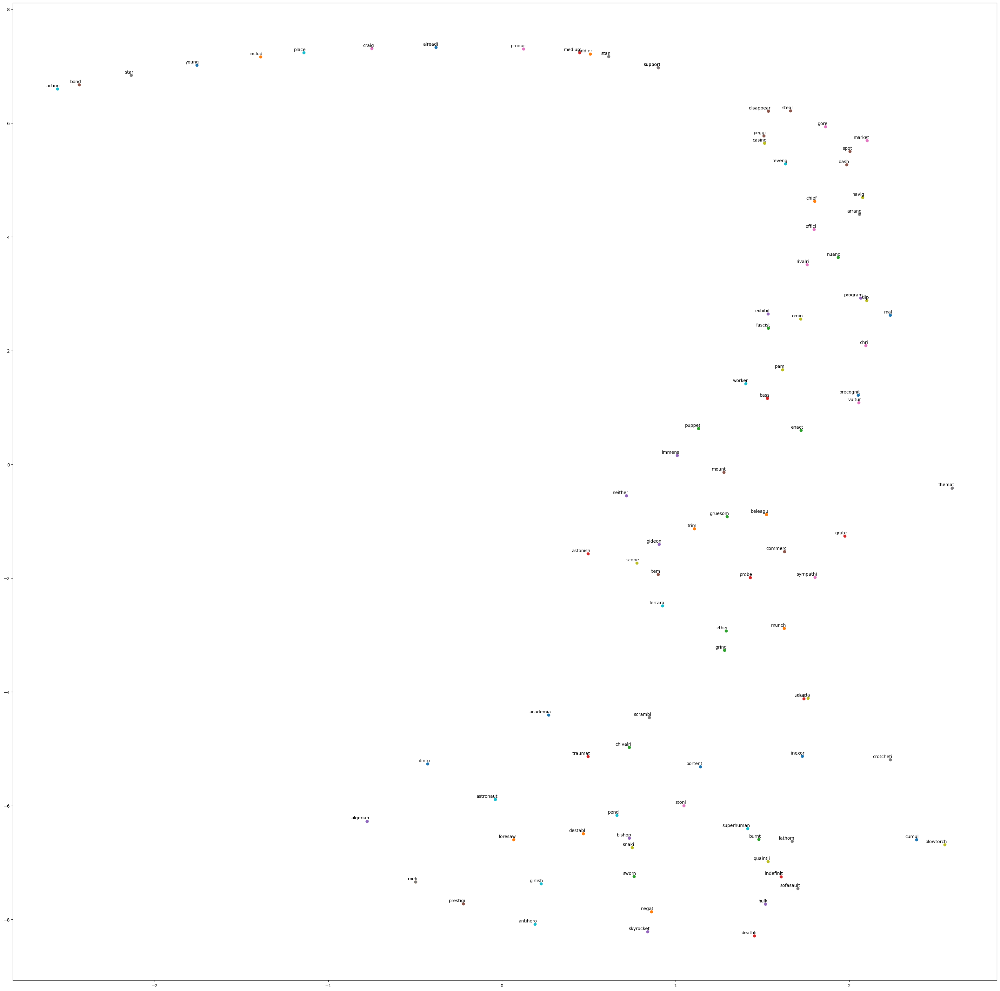

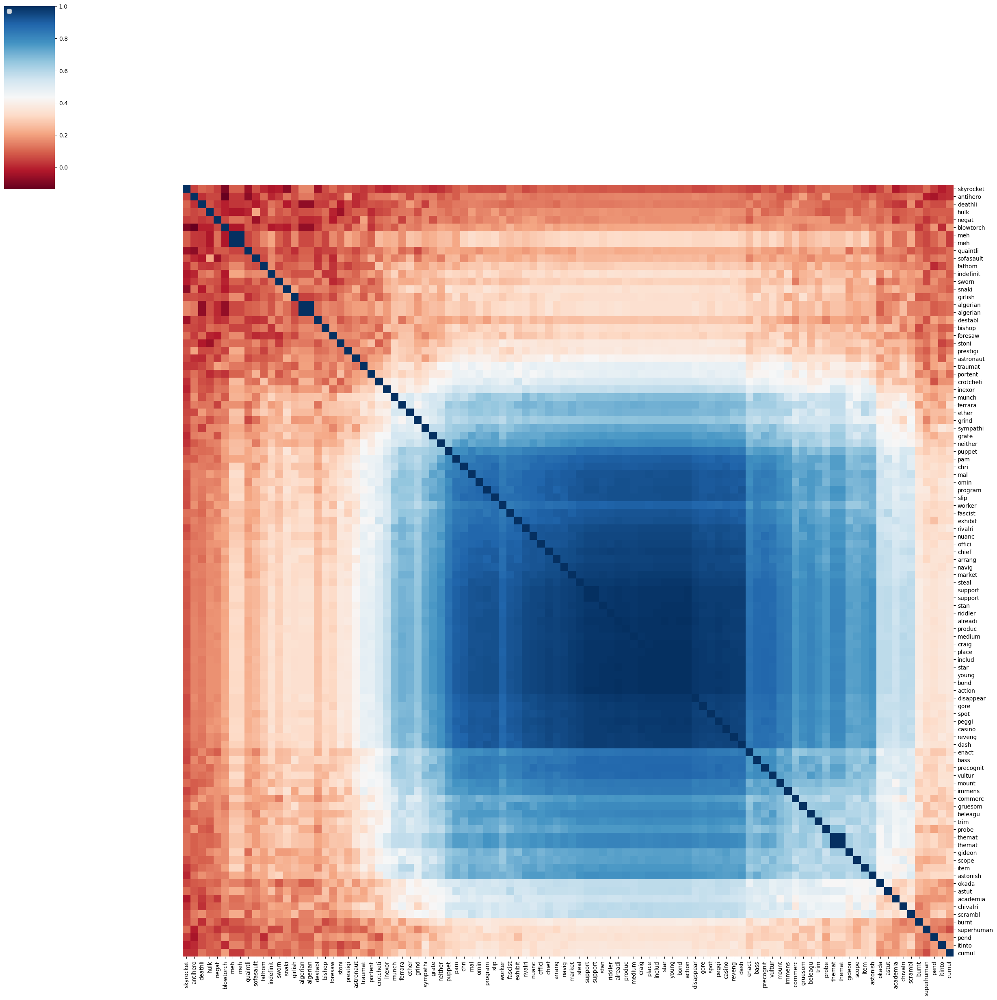

In [246]:
run_word2vec_experiment(documents, clean_method, 300, chosen_tokens, 'Word2Vec_exp')

## Utility functions for Doc2Vec experiments

<div class="alert alert-block alert-success">
    <b>Doc2vec Paragraph Embeddings</b>: https://radimrehurek.com/gensim/models/doc2vec.html <br>
    Paragraph and document embeddings via the distributed memory and distributed bag of words models from Quoc Le and Tomas Mikolov: “Distributed Representations of Sentences and Documents”. <br>

The algorithms use either hierarchical softmax or negative sampling;
            </div>

In [247]:
def run_doc2vec(documents: List[TokenizedDocument], embedding_size: int, descriptors_by_doc_ids: Dict[int, str]):
    tagged_documents = [TaggedDocument(document.tokens, [i]) for i, document in enumerate(documents)]
    doc2vec_model = Doc2Vec(tagged_documents, vector_size=embedding_size, window=3, min_count=2, workers=12)

    doc2vec_df = pd.DataFrame()
    for document in documents:
        vector = pd.DataFrame(doc2vec_model.infer_vector(document.tokens)).transpose()
        doc2vec_df = pd.concat([doc2vec_df, vector], axis=0)

    doc2vec_df['Descriptor'] = [descriptors_by_doc_ids[x.doc_id] for x in documents]
    doc2vec_df.set_index(['Descriptor'], inplace=True)
    return doc2vec_df

def run_doc2vec_experiment(documents: List[Document],
                           clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                           embedding_size: int,
                           experiment_name: str):
    cleaned_documents = clean_func(documents)
    doc2vec_df = run_doc2vec(cleaned_documents, embedding_size, descriptors_by_doc_ids)

    plot_similarity_matrix(doc2vec_df, experiment_name)
    plot_similarity_clustermap(doc2vec_df, experiment_name, figsize=(50, 50))
    plot_tsne(doc2vec_df, 30, experiment_name)

## Doc2Vec Experiments:

<div class="alert alert-block alert-success">
    <b>Doc2vec Paragraph Embeddings</b>: https://radimrehurek.com/gensim/models/doc2vec.html <br>
    Paragraph and document embeddings via the distributed memory and distributed bag of words models from Quoc Le and Tomas Mikolov: “Distributed Representations of Sentences and Documents”. <br>

The algorithms use either hierarchical softmax or negative sampling;
            </div>

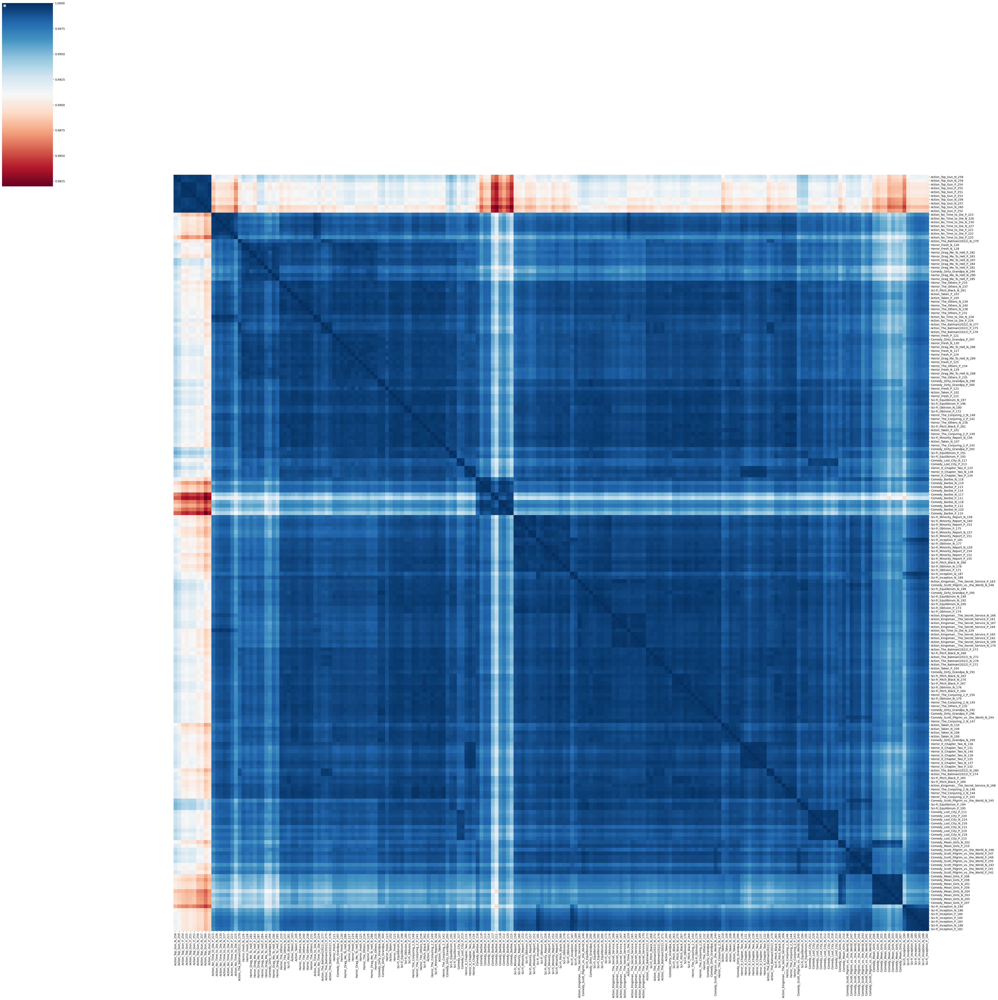

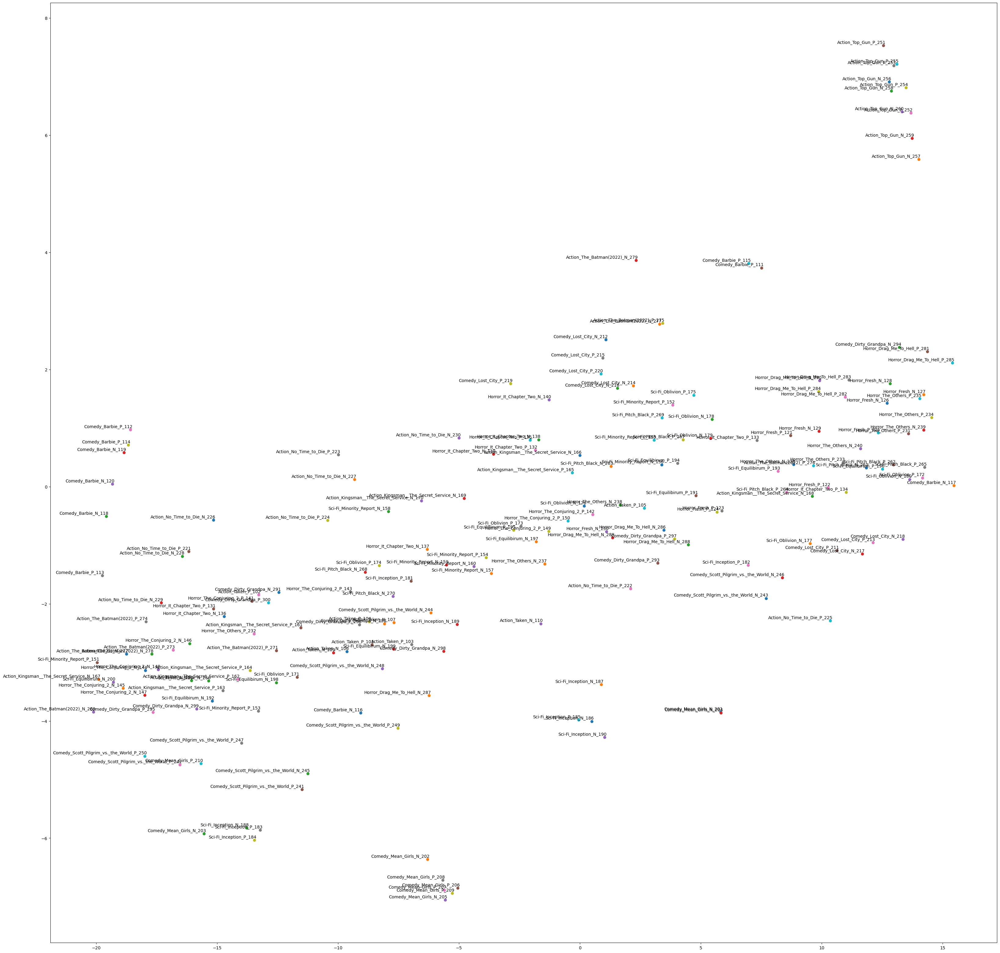

In [248]:
run_doc2vec_experiment(documents, clean_method, 100, 'Doc2Vec_exp')

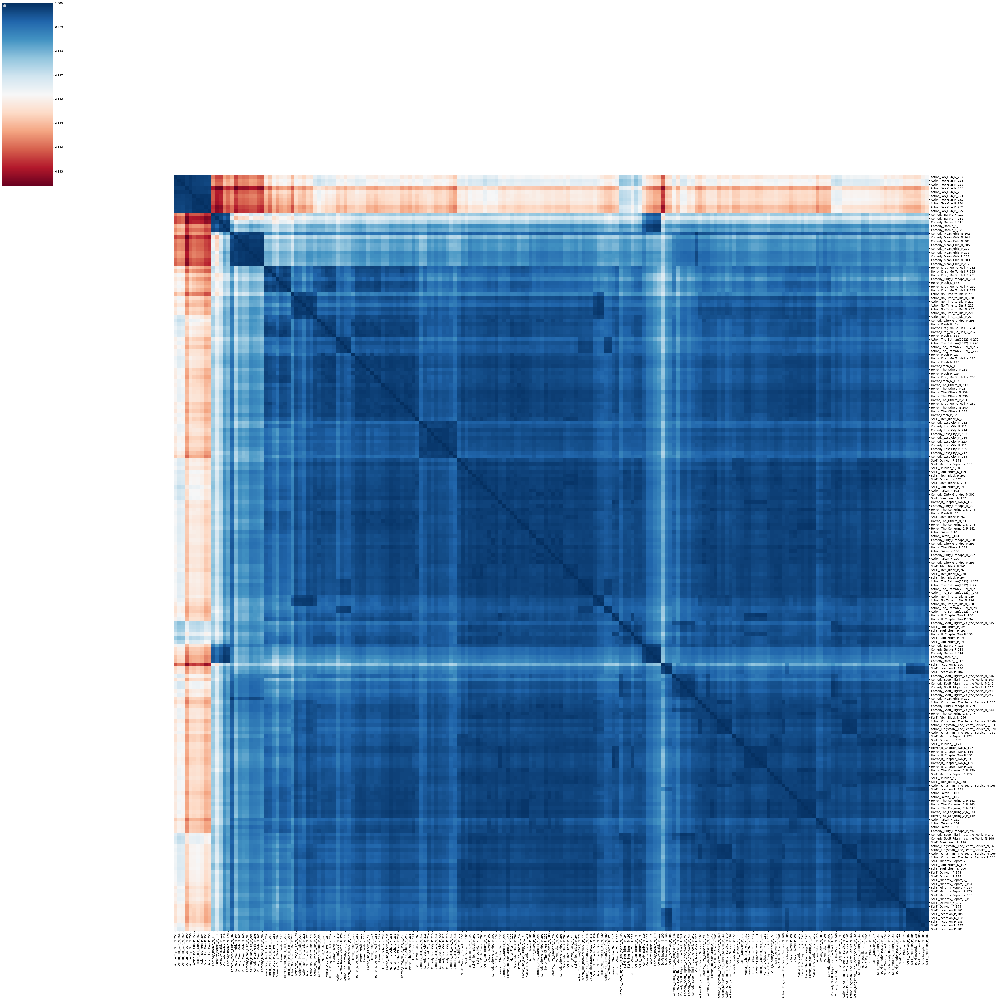

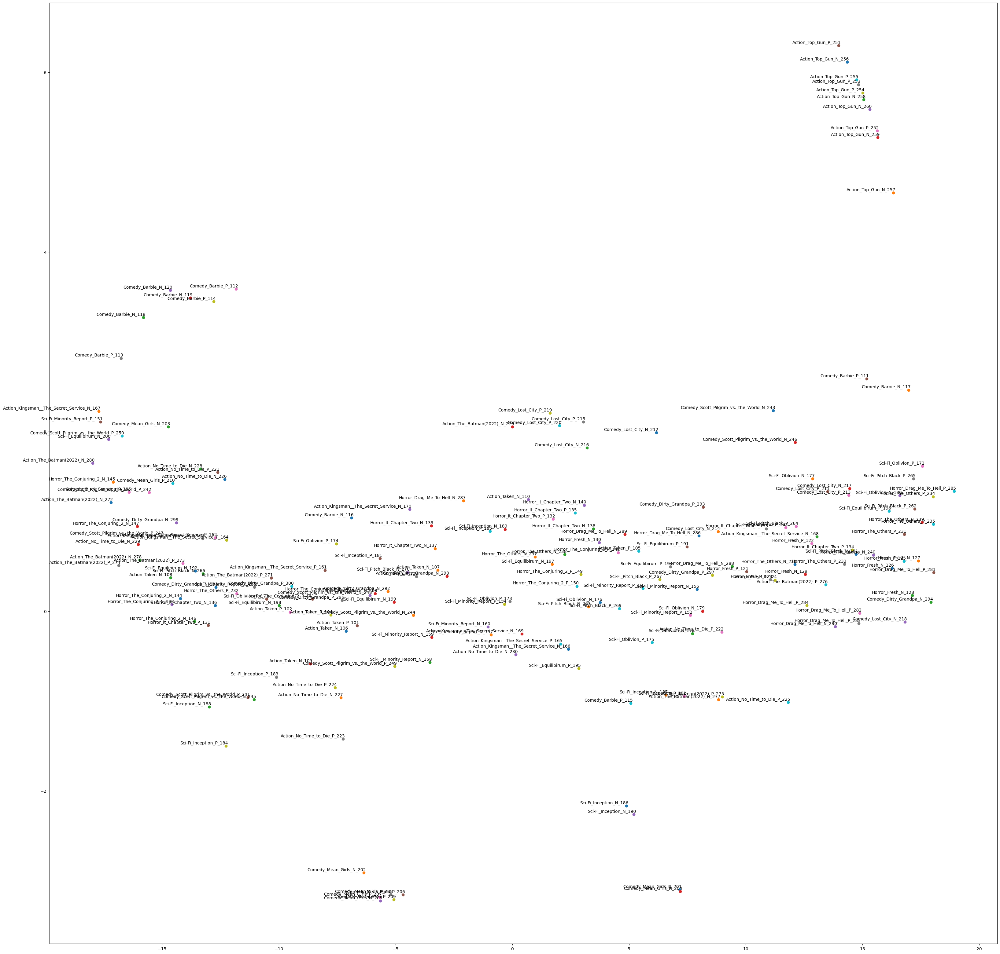

In [249]:
run_doc2vec_experiment(documents, clean_method, 200, 'Doc2Vec_exp')

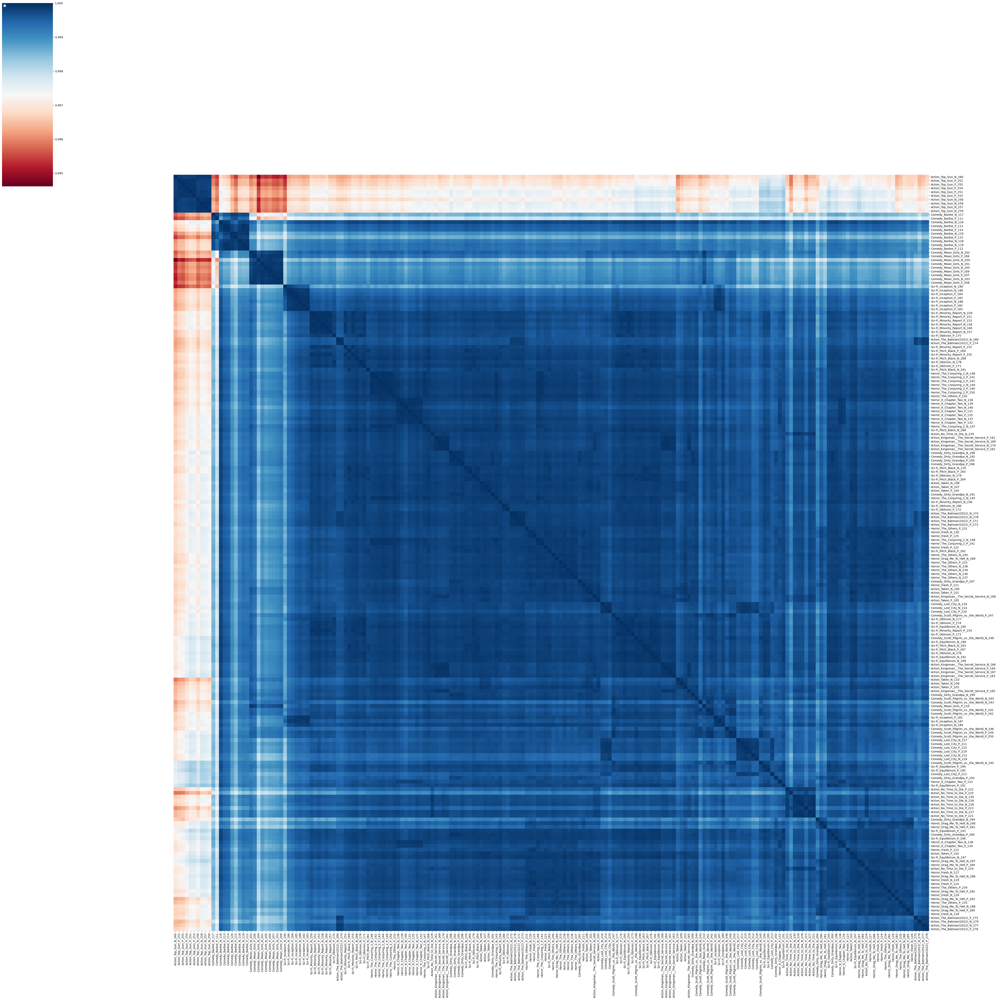

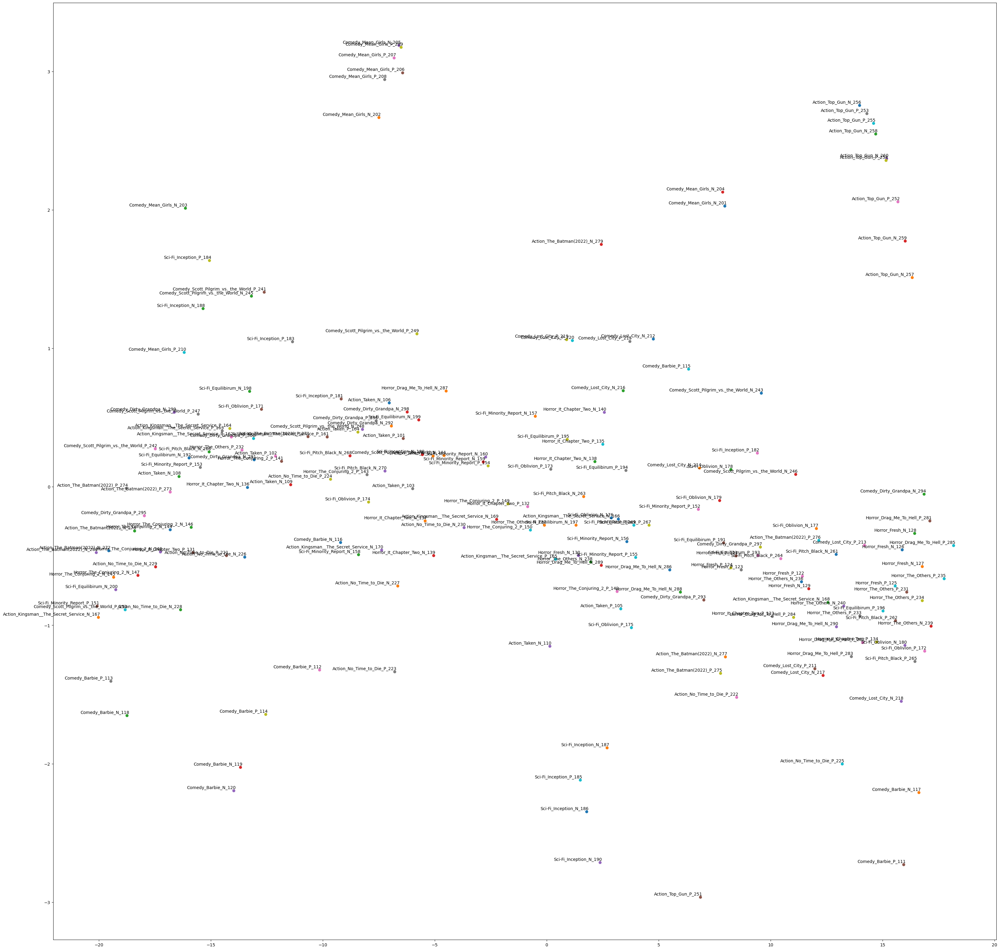

In [250]:
run_doc2vec_experiment(documents, clean_method, 300, 'Doc2Vec_exp')

## **ELMO Emeddings**

Explore ELMo (Embeddings from Language Models) embeddings to enhance our text analysis capabilities. Unlike traditional word embeddings that represent words with static vectors, ELMo provides context-aware embeddings, capturing the nuanced meanings of words based on their usage.

This is a TensorFlow 1 version of ELMo, available at Kaggle https://www.kaggle.com/models/google/elmo/frameworks/tensorFlow1/variations/elmo/versions/3 , compatible with modern Python environments, and we use TensorFlow 2 code instead.

In [251]:
! pip install tensorflow tensorflow-hub

In [252]:
import tensorflow_hub as hub
import tensorflow as tf
import pandas as pd

In [253]:
# TENSOR FLOW 2.x VARIATION

# Load the ELMo model
elmo = hub.load("https://tfhub.dev/google/elmo/3")
embeddings = elmo.signatures['default'](tf.constant(["I have a pen", "I have an apple"]))['elmo']

print(embeddings)


tf.Tensor(
[[[-1.2254357  -0.56004167 -0.17601356 ... -0.48899454 -0.1584761
   -0.02072022]
  [-0.0692865  -0.3224385  -0.20192198 ...  0.06436361 -0.01132805
    0.23569648]
  [ 0.08227276 -0.13877694 -0.11335738 ...  0.09817579 -0.39810342
    0.10647365]
  [-0.59798074 -0.06443994 -0.62319237 ...  0.09078233  0.02052051
    0.28290308]]

 [[-1.2254357  -0.56004167 -0.17601356 ... -0.4785764  -0.06792717
    0.08927002]
  [-0.0692865  -0.3224385  -0.20192198 ...  0.31662858  0.21778783
    0.25088543]
  [-0.1590642  -0.0429517  -0.49626732 ...  0.3048941  -0.08282564
    0.16055599]
  [ 0.33383626 -0.15934706  0.5785627  ...  0.14826353  0.46911323
    0.6117439 ]]], shape=(2, 4, 1024), dtype=float32)


In [254]:
def get_elmo_embeddings(texts):
    """
    Generate ELMo embeddings for a list of texts.

    Parameters:
    - texts: List of strings

    Returns:
    - A Tensor containing the ELMo embeddings for the input texts.
    """
    # Convert texts to TensorFlow constants
    text_tf = tf.constant(texts)

    # Generate ELMo embeddings
    embeddings = elmo.signatures['default'](text_tf)['elmo']

    return embeddings

In [255]:
#documents

In [256]:
# NO DATA WRANGLING
texts = corpus_df['Text'].tolist()

# OR UNCOMMENT FOR DATA WRANGLING
#cleaned_documents = clean_method(documents)
#texts = [' '.join(x.tokens) for x in cleaned_documents]


In [257]:
# Process in batches to manage memory usage
batch_size = 4
# Start with a smaller batch size to monitor performance
# 4 works in Google Collab

all_embeddings = []

# GET ELMO EMBEDDINGS OVER A SUBSET OF ALL MOVIE REVIEWS
sample_size=20

# OR UNCOMMENT TO RUN FOR ALL MOVIE REVIEWS
# Note: Processing all reviews takes over 30 minutes to run.
#sample_size= len(texts)


for i in range(0, sample_size, batch_size):
    batch_texts = texts[i:i+batch_size]
    batch_embeddings = get_elmo_embeddings(batch_texts)
    all_embeddings.append(batch_embeddings)
    print(f"Processed batch {i//batch_size + 1}/{len(texts)//batch_size + 1}")


Processed batch 1/51
Processed batch 2/51
Processed batch 3/51
Processed batch 4/51
Processed batch 5/51


In [258]:
# Convert the list of tensors to a single numpy array
all_embeddings_np = np.concatenate([batch.numpy().mean(axis=1) for batch in all_embeddings], axis=0)


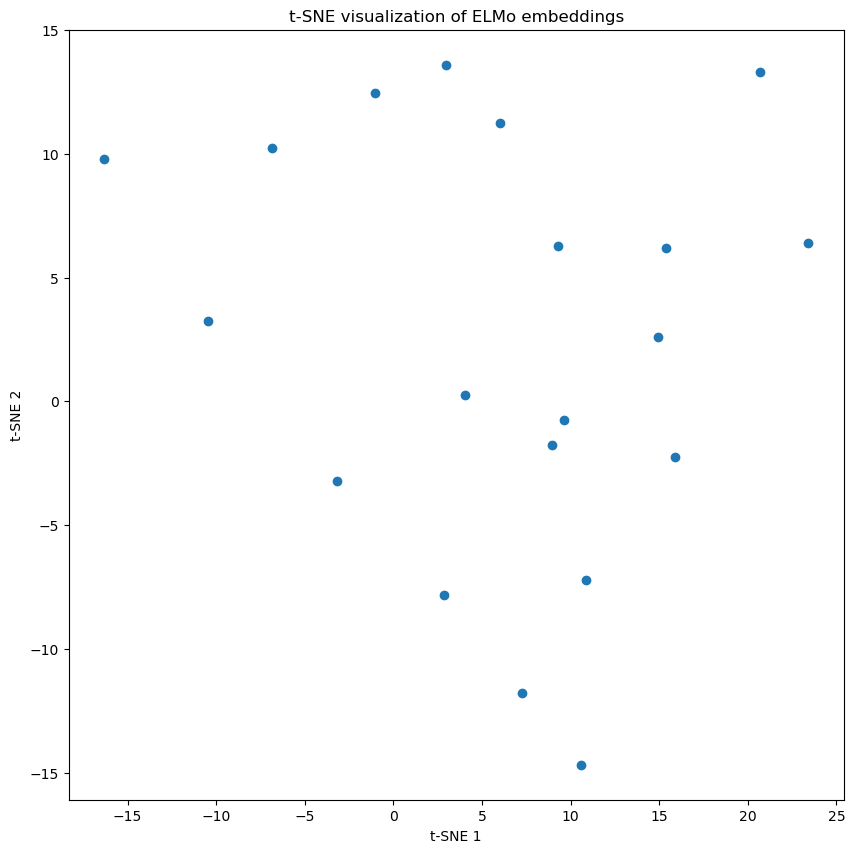

In [259]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Use t-SNE to reduce dimensionality for visualization
if (sample_size>=30):
    tsne = TSNE(n_components=2, random_state=42)
else:
    # Default perplexity is too large for a small sample size
    tsne = TSNE(n_components=2, random_state=42, perplexity=sample_size-1)

embeddings_tsne = tsne.fit_transform(all_embeddings_np)

# Plot
plt.figure(figsize=(10, 10))
plt.scatter(embeddings_tsne[:, 0], embeddings_tsne[:, 1])
plt.title('t-SNE visualization of ELMo embeddings')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()


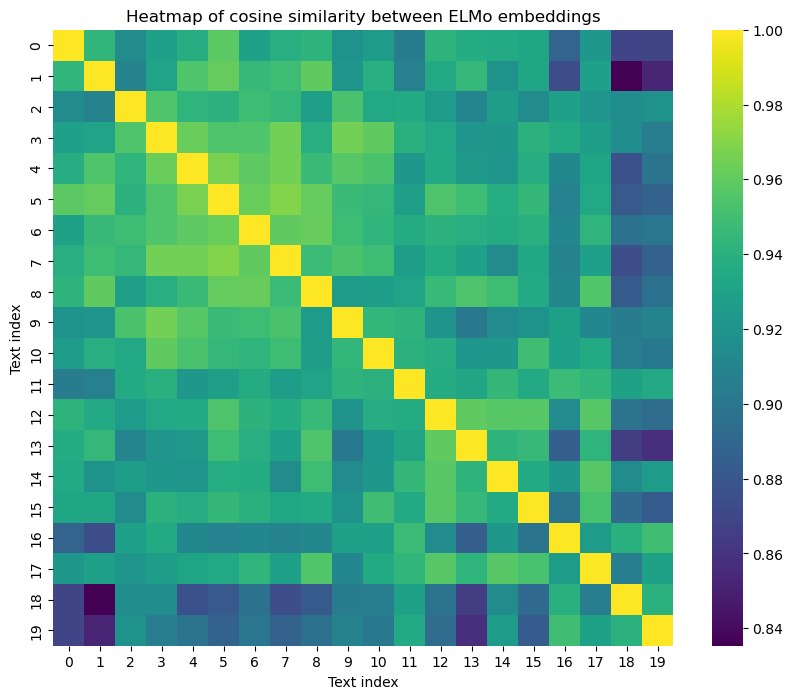

In [260]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

# Compute the cosine similarity matrix
similarity_matrix = cosine_similarity(all_embeddings_np)

# Plot as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix, cmap='viridis')
plt.title('Heatmap of cosine similarity between ELMo embeddings')
plt.xlabel('Text index')
plt.ylabel('Text index')
plt.show()


In [261]:
# Process in batches to manage memory usage
batch_size = 4
# Start with a smaller batch size to monitor performance
# 4 works in Google Collab

all_embeddings = []

# GET ELMO EMBEDDINGS OVER A SUBSET OF ALL MOVIE REVIEWS
# sample_size=20

# OR UNCOMMENT TO RUN FOR ALL MOVIE REVIEWS
# Note: Processing all reviews takes over 30 minutes to run.
sample_size= len(texts)


for i in range(0, sample_size, batch_size):
    batch_texts = texts[i:i+batch_size]
    batch_embeddings = get_elmo_embeddings(batch_texts)
    all_embeddings.append(batch_embeddings)
    print(f"Processed batch {i//batch_size + 1}/{len(texts)//batch_size + 1}")

Processed batch 1/51
Processed batch 2/51
Processed batch 3/51
Processed batch 4/51
Processed batch 5/51
Processed batch 6/51
Processed batch 7/51
Processed batch 8/51
Processed batch 9/51
Processed batch 10/51
Processed batch 11/51
Processed batch 12/51
Processed batch 13/51
Processed batch 14/51
Processed batch 15/51
Processed batch 16/51
Processed batch 17/51
Processed batch 18/51
Processed batch 19/51
Processed batch 20/51
Processed batch 21/51
Processed batch 22/51
Processed batch 23/51
Processed batch 24/51
Processed batch 25/51
Processed batch 26/51
Processed batch 27/51
Processed batch 28/51
Processed batch 29/51
Processed batch 30/51
Processed batch 31/51
Processed batch 32/51
Processed batch 33/51
Processed batch 34/51
Processed batch 35/51
Processed batch 36/51
Processed batch 37/51
Processed batch 38/51
Processed batch 39/51
Processed batch 40/51
Processed batch 41/51
Processed batch 42/51
Processed batch 43/51
Processed batch 44/51
Processed batch 45/51
Processed batch 46/

In [262]:
# Convert the list of tensors to a single numpy array
all_embeddings_np = np.concatenate([batch.numpy().mean(axis=1) for batch in all_embeddings], axis=0)


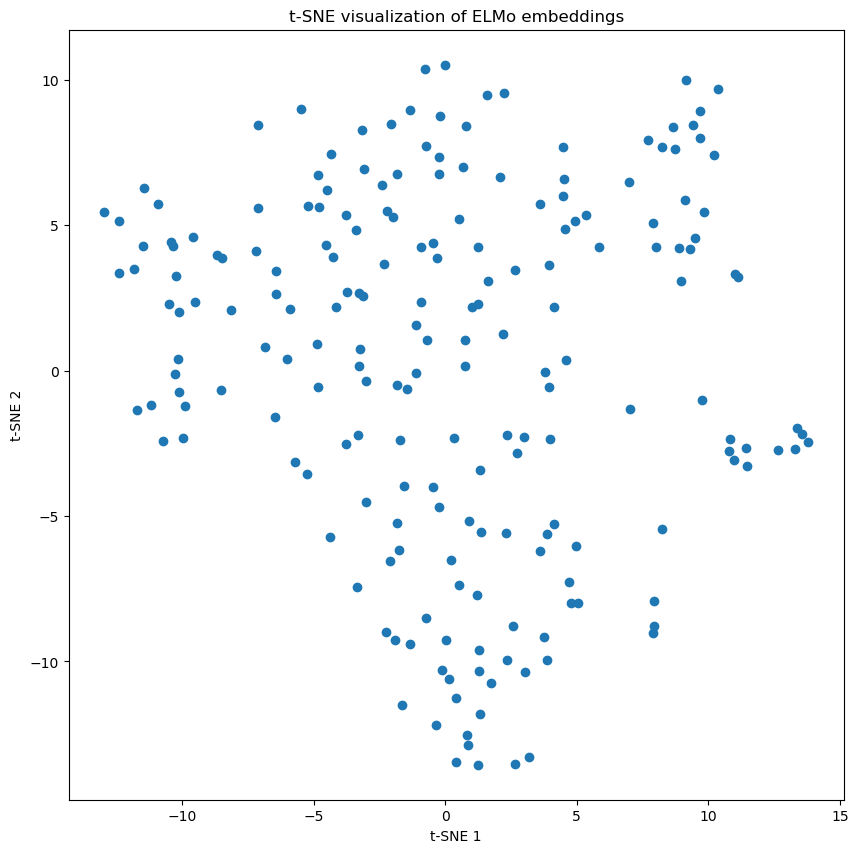

In [263]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Use t-SNE to reduce dimensionality for visualization
if (sample_size>=30):
    tsne = TSNE(n_components=2, random_state=42)
else:
    # Default perplexity is too large for a small sample size
    tsne = TSNE(n_components=2, random_state=42, perplexity=sample_size-1)

embeddings_tsne = tsne.fit_transform(all_embeddings_np)

# Plot
plt.figure(figsize=(10, 10))
plt.scatter(embeddings_tsne[:, 0], embeddings_tsne[:, 1])
plt.title('t-SNE visualization of ELMo embeddings')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()


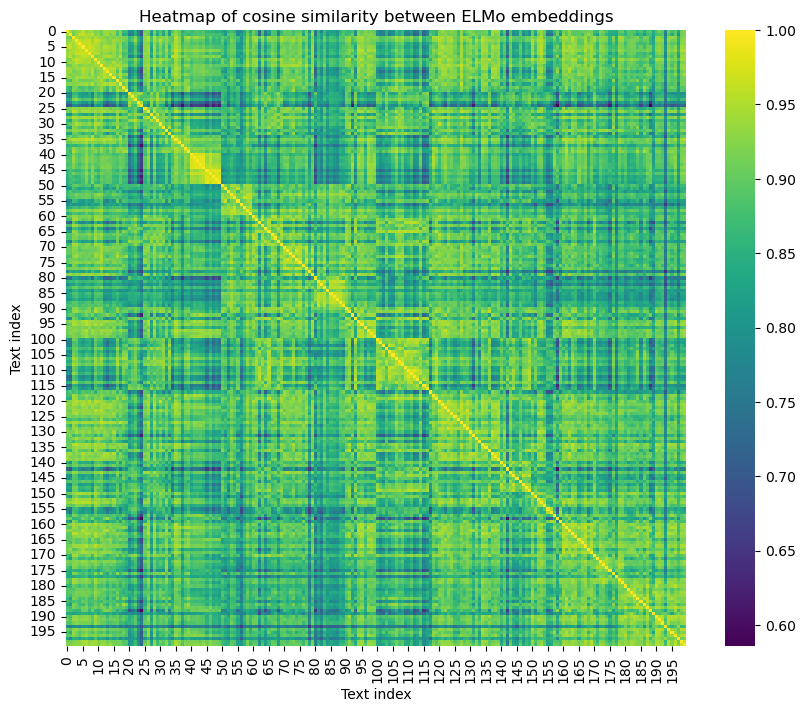

In [264]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

# Compute the cosine similarity matrix
similarity_matrix = cosine_similarity(all_embeddings_np)

# Plot as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix, cmap='viridis')
plt.title('Heatmap of cosine similarity between ELMo embeddings')
plt.xlabel('Text index')
plt.ylabel('Text index')
plt.show()


In [265]:
 !jupyter nbconvert --to pdf Final_MSDS453_Assignment_01.ipynb

[NbConvertApp] Converting notebook Final_MSDS453_Assignment_01.ipynb to pdf
[NbConvertApp] Support files will be in Final_MSDS453_Assignment_01_files/
[NbConvertApp] Making directory ./Final_MSDS453_Assignment_01_files
[NbConvertApp] Writing 182167 bytes to notebook.tex
[NbConvertApp] Building PDF
[NbConvertApp] Running xelatex 3 times: ['xelatex', 'notebook.tex', '-quiet']
[NbConvertApp] CRITICAL | xelatex failed: ['xelatex', 'notebook.tex', '-quiet']
b"This is XeTeX, Version 3.141592653-2.6-0.999995 (TeX Live 2023) (preloaded format=xelatex)\n restricted \\write18 enabled.\nentering extended mode\n(./notebook.tex\nLaTeX2e <2022-11-01> patch level 1\nL3 programming layer <2023-02-22>\n(/usr/local/texlive/2023/texmf-dist/tex/latex/base/article.cls\nDocument Class: article 2022/07/02 v1.4n Standard LaTeX document class\n(/usr/local/texlive/2023/texmf-dist/tex/latex/base/size11.clo))\n(/usr/local/texlive/2023/texmf-dist/tex/latex/tcolorbox/tcolorbox.sty\n(/usr/local/texlive/2023/texmf-di